# Convolutional Autoencoder

Sticking with the MNIST dataset, let's improve our autoencoder's performance using convolutional layers. Again, loading modules and the data.

In [1]:
%matplotlib inline

import numpy as np
import tensorflow as tf 
import matplotlib.pyplot as plt
import os 
import matplotlib.pyplot as plt
from matplotlib.image import imread
from scipy.misc import imsave
from scipy.misc import imresize
import numpy as np
from numpy import genfromtxt
import tensorflow as tf
from PIL import Image
import pickle
# from tensorflow_vgg import vgg16|
import collections
import time
import math

# Import GEI dataset 

(128, 88)


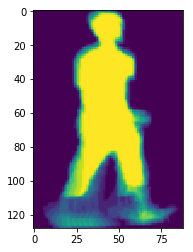

In [6]:
img = imread('{}'.format(os.path.join('./OULP-C1V2_Pack/OULP-GEI-(88x128)-10f/Seq00/0000024', '0000024_55_GEI_10f.png')))
# img = imresize(img, [64, 64], interp='nearest')
print(img.shape)
plt.imshow(img)
plt.show()

In [102]:
# Create Training Data
path = './OULP-C1V2_Pack/OULP-GEI-(88x128)-5f_5/Seq01'
Seq_10f_list = os.listdir(path)
# Seq_10f_list.remove('.DS_Store')

Seq = []
for each_seq in Seq_10f_list:
    seq_path = os.path.join(path, each_seq)
    GEI = []
    for each_GEI in os.listdir(seq_path):
        img = imread('{}'.format(os.path.join(seq_path, each_GEI)))
        img = imresize(img, [64, 64], interp='nearest')
        GEI.append(img)
    Seq.append(np.array(GEI))
Seq = np.array(Seq)
Seq1 = np.ndarray([len(Seq),4,64,64], dtype=float)
for ii, each in enumerate(Seq):
    Seq1[ii] = each

In [103]:
with open('../gait_data/OULP_GEI/GEI64x64_5f_5_Seq01', 'wb') as f:
    np.save(f, Seq1)

# Checkpoint 1

In [2]:
gallery_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq00', mode='rb'))
probe_5f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_Seq01', mode='rb'))
gallery_10f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_Seq00', mode='rb'))
probe_10f = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_Seq01', mode='rb'))

gallery_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq00', mode='rb'))
probe_5f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_2_Seq01', mode='rb'))
gallery_10f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_2_Seq00', mode='rb'))
probe_10f_2 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_2_Seq01', mode='rb'))

gallery_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq00', mode='rb'))
probe_5f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_3_Seq01', mode='rb'))
gallery_10f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_3_Seq00', mode='rb'))
probe_10f_3 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_3_Seq01', mode='rb'))

gallery_5f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_4_Seq00', mode='rb'))
probe_5f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_5f_4_Seq01', mode='rb'))
gallery_10f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_4_Seq00', mode='rb'))
probe_10f_4 = np.load(open(r'../gait_data/OULP_GEI/GEI64x64_10f_4_Seq01', mode='rb'))

In [3]:
gallery_5f = gallery_5f/float(255)
probe_5f = probe_5f/float(255)
gallery_10f = gallery_10f/float(255)
probe_10f = probe_10f/float(255)

gallery_5f_2 = gallery_5f_2/float(255)
probe_5f_2 = probe_5f_2/float(255)
gallery_10f_2 = gallery_10f_2/float(255)
probe_10f_2 = probe_10f_2/float(255)

gallery_5f_3 = gallery_5f_3/float(255)
probe_5f_3 = probe_5f_3/float(255)
gallery_10f_3 = gallery_10f_3/float(255)
probe_10f_3 = probe_10f_3/float(255)

gallery_5f_4 = gallery_5f_4/float(255)
probe_5f_4 = probe_5f_4/float(255)
gallery_10f_4 = gallery_10f_4/float(255)
probe_10f_4 = probe_10f_4/float(255)

<br><br><br><br><br><br><br><br><br>

In [37]:
# Train X
train_x = np.concatenate([gallery_5f[:2146, 3], probe_5f[:2146, 3], gallery_5f_2[:2146, 3], 
                          probe_5f_2[:2146, 3], gallery_5f_3[:2146, 3], probe_5f_3[:2146, 3]], axis=0)
train_x = np.reshape(train_x, [train_x.shape[0], train_x.shape[1], train_x.shape[2], 1])
# Train Y
train_y = np.concatenate([gallery_10f[:2146, 3], probe_10f[:2146, 3], gallery_10f_2[:2146, 3], 
                          probe_10f_2[:2146, 3], gallery_10f_3[:2146, 3], probe_10f_3[:2146, 3]], axis=0)
train_y = np.reshape(train_y, [train_y.shape[0], train_y.shape[1], train_y.shape[2], 1])
print('train_x', train_x.shape, 'train_y', train_y.shape)

# Val X
val_x = np.concatenate([gallery_5f[2146:2646, 3], gallery_5f_2[2146:2646, 3], gallery_5f_3[2146:2646, 3],
                        probe_5f[2146:2646, 3], probe_5f_2[2146:2646, 3], probe_5f_3[2146:2646, 3]], axis=0)
val_x = np.reshape(val_x, [val_x.shape[0], val_x.shape[1], val_x.shape[2], 1])
# Val Y
val_y = np.concatenate([gallery_10f[2146:2646, 3], gallery_10f_2[2146:2646, 3], gallery_10f_3[2146:2646, 3], 
                        probe_10f[2146:2646, 3], probe_10f_2[2146:2646, 3], probe_10f_3[2146:2646, 3]], axis=0)
val_y = np.reshape(val_y, [val_y.shape[0], val_y.shape[1], val_y.shape[2], 1])
print('val_x', val_x.shape, 'val_y', val_y.shape)

# Test X
test_x = np.concatenate([gallery_5f[2646:, 3], gallery_5f_2[2646:, 3], gallery_5f_3[2646:, 3],
                         probe_5f[2646:, 3], probe_5f_2[2646:, 3], probe_5f_3[2646:, 3]], axis=0)
test_x = np.reshape(test_x, [test_x.shape[0], test_x.shape[1], test_x.shape[2], 1])
# Test Y
test_y = np.concatenate([gallery_10f[2646:, 3], gallery_10f_2[2646:, 3], gallery_10f_3[2646:, 3], 
                         probe_10f[2646:, 3], probe_10f_2[2646:, 3], probe_10f_3[2646:, 3]], axis=0)
test_y = np.reshape(test_y, [test_y.shape[0], test_y.shape[1], test_y.shape[2], 1])
print('test_x', test_x.shape, 'test_y', test_y.shape)

train_x (12876, 64, 64, 1) train_y (12876, 64, 64, 1)
val_x (3000, 64, 64, 1) val_y (3000, 64, 64, 1)
test_x (3000, 64, 64, 1) test_y (3000, 64, 64, 1)


# Create Graph

In [38]:
def build_inputs_outputs():
    inputs_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='inputs_1')
    targets_1 = tf.placeholder(tf.float32, (None, 64, 64, 1), name='targets_1')
    
    return inputs_1, targets_1

def conv_layer(inputs_, weights_name, bias_name, conv_name, pool_name, bn_name, relu_name, add_bacth_norm=True, is_training=True, 
               set_stddev=0.03, out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), pool_size=(2,2), pool_strides=(2,2), 
               keep_prob=0.5):
    ### Encoder
    # e.g. out_dim: 8; kern_size: (3,3); pool_size: (2,2); strides: (2,2);
        
    # filter:[filter_height, filter_width, in_channels, out_channels]
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         inputs_.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name) 
    
    # Set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    # input:[batch, in_height, in_width, in_channels]
    conv2d = tf.nn.bias_add(tf.nn.conv2d(inputs_, weight, stride, padding='SAME', name=conv_name), bias)
    
    # add activation function
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    # add Max pooling
    conv2d = tf.nn.max_pool(conv2d, [1,pool_size[0],pool_size[1],1],\
                                    [1,pool_strides[0],pool_strides[1],1], padding='SAME', name=pool_name)   
    # Now 28x28x
    if add_bacth_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
        
    conv2d_maxpool = tf.layers.dropout(conv2d, rate=keep_prob)
        
    return conv2d_maxpool

#     # Now 14x14x16
#     conv2 = tf.layers.conv2d(maxpool1, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
#     # Now 7x7x8
#     conv3 = tf.layers.conv2d(maxpool2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 7x7x8
#     encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
#     # Now 4x4x8

def deconv_layer(encoded, up_name, weights_name, bias_name, de_conv_name, bn_name, relu_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, up_size=[(2,2),(4,4),(5,5),(6,6)], out_dim=1, conv_kernsize=(2,2), conv_strides=(1,1), keep_prob=0.5):
    ### Decoder
    upsample = tf.image.resize_nearest_neighbor(encoded, up_size, name=up_name) # up_size: e.g.(7,7)
    
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         upsample.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    conv2d = tf.nn.bias_add(tf.nn.conv2d(upsample, weight, stride, padding='SAME', name=de_conv_name),\
                   bias)
    
    conv2d = tf.nn.relu(conv2d, name=relu_name)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    
    conv2d = tf.layers.dropout(conv2d, rate=keep_prob)
    
    return conv2d

#     # Now 7x7x8
#     upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
#     # Now 14x14x8
#     conv5 = tf.layers.conv2d(upsample2, 8, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 14x14x8
#     upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
#     # Now 28x28x8
#     conv6 = tf.layers.conv2d(upsample3, 16, (3,3), padding='same', activation=tf.nn.relu)
#     # Now 28x28x16

def output_layer(conv2d, weights_name, bias_name, logits_name, bn_name, decoded_name, add_batch_norm=True, is_training=True, 
                 set_stddev=0.03, out_dim=1, conv_kernsize=(3,3), conv_strides=(1,1)):
    # set weight (filter)
    weight = tf.Variable(tf.truncated_normal([conv_kernsize[0],conv_kernsize[1],\
                         conv2d.get_shape().as_list()[3], out_dim], stddev=set_stddev),\
                         name=weights_name)
    
    # set bias
    bias = tf.Variable(tf.zeros(out_dim), name=bias_name)
    
    # set strides of conv2d
    stride = [1, conv_strides[0], conv_strides[1], 1]
    
    # conv2d
    logits = tf.nn.bias_add(tf.nn.conv2d(conv2d, weight, stride, padding='SAME', name=logits_name),\
                   bias)
    
    if add_batch_norm:
        conv2d = tf.layers.batch_normalization(conv2d, training=is_training, name=bn_name)
    #Now 28x28x1
    decoded = tf.nn.sigmoid(logits, name=decoded_name)
    
    return logits, decoded

In [44]:
def build_graph(kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, 
                de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)]):
    
    # reset graph
    tf.reset_default_graph()
    
    with tf.name_scope('inputs_targets'):
        inputs_1, targets_1 = build_inputs_outputs()
    
    keep_p = tf.placeholder(tf.float32, name="keep_prob")
    
    learning_rate = tf.placeholder(tf.float32, name='learning_rate')
    
    training = tf.placeholder(tf.bool, name='training')
    
    with tf.name_scope('conv_layers'):
        
        maxpool_1 = conv_layer(inputs_1, 'conv_weights_1', 'bias_1', 'conv_1', 'pool_1', 'bn_1', 'relu_1', add_bacth_norm=False, 
                               is_training=training, set_stddev=std, out_dim=64, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_2 = conv_layer(maxpool_1, 'conv_weights_2', 'bias_2', 'conv_2', 'pool_2', 'bn_2', 'relu_2', add_bacth_norm=True, 
                               is_training=training, set_stddev=std, out_dim=32, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
        maxpool_3 = conv_layer(maxpool_2, 'conv_weights_3', 'bias_3', 'conv_3', 'pool_3', 'bn_3', 'relu_3', add_bacth_norm=True, 
                               is_training=training, set_stddev=std, out_dim=16, conv_kernsize=kern_size, conv_strides=conv_strides, 
                               pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        
#         maxpool_4 = conv_layer(maxpool_3, 'conv_weights_4', 'bias_4', 'conv_4', 'pool_4', 'bn_4', 'relu_4', add_bacth_norm=True, 
#                                is_training=training, set_stddev=std, out_dim=8, conv_kernsize=kern_size, conv_strides=conv_strides, 
#                                pool_size=pool_size, pool_strides=pool_strides, keep_prob=keep_p)
        # Now 4x4x8 as hidden layer
        
    with tf.name_scope('deconv_layers'):
        
        deconv_1 = deconv_layer(maxpool_3, 'up_1', 'deconv_weights_1', 'debias_1', 'deconv_1', 'de_bn_1', 'de_relu_1', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[0], out_dim=16, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_2 = deconv_layer(deconv_1, 'up_2', 'deconv_weights_2', 'debias_2', 'deconv_2', 'de_bn_2', 'de_relu_2', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[1], out_dim=32, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
        deconv_3 = deconv_layer(deconv_2, 'up_3', 'deconv_weights_3', 'debias_3', 'deconv_3', 'de_bn_3', 'de_relu_3', add_batch_norm=True, 
                              is_training=training, set_stddev=std, up_size=up_size[2], out_dim=64, conv_kernsize=de_kern_size,
                              conv_strides=de_conv_strides, keep_prob=keep_p)
        
#         deconv_4 = deconv_layer(deconv_3, 'up_4', 'deconv_weights_4', 'debias_4', 'deconv_4', 'de_bn_4', 'de_relu_4', add_batch_norm=True, 
#                               is_training=training, set_stddev=std, up_size=up_size[3], out_dim=64, conv_kernsize=de_kern_size,
#                               conv_strides=de_conv_strides, keep_prob=keep_p)
        
    with tf.name_scope('output_layer'):
       
        logits, decoded = output_layer(deconv_3, 'output_weights', 'outbias_1', 'logits', 'bn', 'decoded', add_batch_norm=False, is_training=training, 
                                       set_stddev=std, out_dim=1, conv_kernsize=out_kern_size, conv_strides=out_strides)
        
    loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_1, logits=logits, name='loss')
    cost = tf.reduce_mean(loss, name='cost')
#     cost = tf.losses.mean_squared_error(targets_1, decoded)
    opt = tf.train.AdamOptimizer(learning_rate).minimize(cost)
    
    with tf.name_scope('saver'):
        saver = tf.train.Saver()
        
#     merged = tf.summary.merge_all()
    
    export_nodes = ['inputs_1', 'targets_1', 'maxpool_1', 'maxpool_2', 'deconv_1', 'deconv_2', 'training',
                    'logits', 'decoded', 'loss', 'cost', 'opt', 'saver', 'learning_rate', 'keep_p']
    
    Graph = collections.namedtuple('Graph', export_nodes)
    local_dict = locals()
    graph = Graph(*[local_dict[each] for each in export_nodes])
    
    return graph

In [45]:
def get_batches(data, target, batch_size):
    n_batches = len(data)//batch_size
    data = data[:batch_size * n_batches]
    target = target[:batch_size * n_batches]
    for ii in range(0, batch_size*n_batches, batch_size):
        data_batch = data[ii:ii + batch_size]
        target_batch = target[ii:ii + batch_size]
        
        yield data_batch, target_batch
        
        
def cal_accuracy(decoded, target):
    error = abs(decoded - target)
    Acc = (np.sum(error <= 0.08)/(decoded.shape[0]*decoded.shape[1]*decoded.shape[2]*decoded.shape[3]))*100
    
    return Acc

In [46]:
def train(model, epochs, save_string):

    with tf.Session(config=tf.ConfigProto(log_device_placement=True)) as sess:
        sess.run(tf.global_variables_initializer())
        
        iteration = 1
        mean_val_loss = 0
        mean_val_acc = 0
        count_loss_not_decrease_epochs = 0
        count_acc_not_decrease_epochs = 0
        Last_val_loss = 0
        Last_val_acc = 0
        
        
        for e in range(epochs):
            for train_batch, target_batch in get_batches(train_x, train_y, batch_size):
                    
                start = time.time()
                
                feed_1 = {
                        model.inputs_1: train_batch, 
                        model.targets_1: target_batch,
                        model.keep_p: 0.5,
                        model.learning_rate: lr,
                        model.training:True
                        }

                train_loss, _, decoded_img = sess.run([model.cost, model.opt, model.decoded], feed_dict=feed_1)
                
                train_acc = cal_accuracy(decoded_img, target_batch)
                
                if iteration%25==0:
                    end = time.time()
#                     acc = calculate_accuracy(sess, pred, target_batch, sq_length)
                    print("Epoch: {}/{},".format(e+1, epochs),' '
                          "Iteration: {},".format(iteration),' '
                          "Train loss: {:.3f},".format(train_loss),'      '
                          "{:.1f}s /batch.".format((end-start)/5),' '
                          "Train Accuracy: %{:.3f}".format(train_acc))

                ##############################################################
                ######################## VALIDATION ##########################
                ##############################################################
                
                if iteration%75==0:
#                     training = True
                    validation_loss = []
                    validation_acc = []
                    
                    if batch_size >= len(val_x):
                        val_batch_size = len(val_x)
                    else: 
                        val_batch_size = batch_size
                        

                    for ii, (val_batch, val_target_batch) in enumerate(get_batches(val_x, val_y, val_batch_size)):
#                         print(ii, len(val_x)//val_batch_size)
                        feed_2 = {
                                model.inputs_1: val_batch,
                                model.targets_1: val_target_batch,
                                model.keep_p: 1,
                                model.training:True
                                }
                        
                        val_loss, val_decoded_img = sess.run([model.cost, model.decoded], 
                                                                          feed_dict=feed_2)

                        val_acc = cal_accuracy(val_decoded_img, val_target_batch)
                        
                        validation_loss.append(val_loss)
                        validation_acc.append(val_acc)
                    
                    Last_val_loss = mean_val_loss
                    Last_val_acc = mean_val_acc
                    mean_val_loss = np.mean(np.array(validation_loss))
                    mean_val_acc = np.mean(np.array(validation_acc))
                    
                    print()
                    print("Validation loss: {:.3f},".format(mean_val_loss),' '
                          "Validation accuracy: %{:.3f},".format(mean_val_acc))
#                           "maxpool_3.shape: {}.".format(max_pool_3[0].shape))
                    print()
                ####### plot #######
                if iteration%500==0:
                    
                    feed_3 = {
                            model.inputs_1: val_x[:10],
                            model.keep_p: 1,
                            model.training:True
                            }
                    
                    fig, axes = plt.subplots(nrows=3, ncols=10, sharex=True, sharey=True, figsize=(20,4))
                    in_imgs = val_x[:10]
                    target_imgs = val_y[:10]
                    reconstructed = sess.run(model.decoded, feed_dict=feed_3)

                    # plot out
                    for images, row in zip([in_imgs, target_imgs, reconstructed], axes):
                        for img, ax in zip(images, row):
                            ax.imshow(img.reshape((64, 64)), cmap='Greys_r')
                            ax.get_xaxis().set_visible(False)
                            ax.get_yaxis().set_visible(False)


                    fig.tight_layout(pad=0.1)
                            
                    
                    
                    
                    
                iteration += 1
                
            # Early stopping 
            if mean_val_acc > 87.6:
                break
#             if mean_val_Acc - Last_val_Acc <= -0.3:
#                 count_Acc_not_increase_epochs += 1
#             if Last_val_loss - mean_val_loss <= -0.01:
#                 count_loss_not_decrease_epochs += 1
                
#             if mean_val_Acc - Last_val_Acc <= -2:
#                 break
#             if count_Acc_not_increase_epochs >= 10:
#                 break
#             if count_loss_not_decrease_epochs >= 10:
#                 break
                
        model.saver.save(sess, r"{}".format(save_string))

mkdir: cannot create directory ‘checkpoints_view_invariant’: File exists
Epoch: 1/3000,  Iteration: 25,  Train loss: 0.385,       0.0s /batch.  Train Accuracy: %18.299
Epoch: 1/3000,  Iteration: 50,  Train loss: 0.309,       0.0s /batch.  Train Accuracy: %23.476
Epoch: 1/3000,  Iteration: 75,  Train loss: 0.262,       0.0s /batch.  Train Accuracy: %38.399

Validation loss: 0.267,  Validation accuracy: %40.756,

Epoch: 1/3000,  Iteration: 100,  Train loss: 0.234,       0.0s /batch.  Train Accuracy: %61.335
Epoch: 1/3000,  Iteration: 125,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %73.307
Epoch: 1/3000,  Iteration: 150,  Train loss: 0.217,       0.0s /batch.  Train Accuracy: %74.894

Validation loss: 0.222,  Validation accuracy: %74.977,

Epoch: 2/3000,  Iteration: 175,  Train loss: 0.212,       0.0s /batch.  Train Accuracy: %75.359
Epoch: 2/3000,  Iteration: 200,  Train loss: 0.193,       0.0s /batch.  Train Accuracy: %79.446
Epoch: 2/3000,  Iteration: 225,  Train loss: 0.1

Epoch: 12/3000,  Iteration: 1800,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %86.258

Validation loss: 0.185,  Validation accuracy: %82.613,

Epoch: 12/3000,  Iteration: 1825,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %86.262
Epoch: 12/3000,  Iteration: 1850,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %86.588
Epoch: 12/3000,  Iteration: 1875,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %86.593

Validation loss: 0.185,  Validation accuracy: %83.694,

Epoch: 12/3000,  Iteration: 1900,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %86.678
Epoch: 13/3000,  Iteration: 1925,  Train loss: 0.185,       0.0s /batch.  Train Accuracy: %80.023
Epoch: 13/3000,  Iteration: 1950,  Train loss: 0.180,       0.0s /batch.  Train Accuracy: %84.358

Validation loss: 0.185,  Validation accuracy: %83.239,

Epoch: 13/3000,  Iteration: 1975,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %85.408
Epoch: 13/3000,  Iteration: 2000,  Train loss

Epoch: 23/3000,  Iteration: 3550,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %85.437
Epoch: 23/3000,  Iteration: 3575,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.062
Epoch: 23/3000,  Iteration: 3600,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %87.065

Validation loss: 0.181,  Validation accuracy: %85.120,

Epoch: 23/3000,  Iteration: 3625,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.179
Epoch: 23/3000,  Iteration: 3650,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %87.646
Epoch: 23/3000,  Iteration: 3675,  Train loss: 0.228,       0.0s /batch.  Train Accuracy: %75.065

Validation loss: 0.181,  Validation accuracy: %84.552,

Epoch: 24/3000,  Iteration: 3700,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.341
Epoch: 24/3000,  Iteration: 3725,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %86.609
Epoch: 24/3000,  Iteration: 3750,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %86.549

Val

Epoch: 34/3000,  Iteration: 5325,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %87.111

Validation loss: 0.180,  Validation accuracy: %85.293,

Epoch: 34/3000,  Iteration: 5350,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %87.419
Epoch: 34/3000,  Iteration: 5375,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %88.644
Epoch: 34/3000,  Iteration: 5400,  Train loss: 0.159,       0.0s /batch.  Train Accuracy: %88.829

Validation loss: 0.181,  Validation accuracy: %85.483,

Epoch: 34/3000,  Iteration: 5425,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %87.545
Epoch: 35/3000,  Iteration: 5450,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %83.767
Epoch: 35/3000,  Iteration: 5475,  Train loss: 0.177,       0.0s /batch.  Train Accuracy: %87.111

Validation loss: 0.181,  Validation accuracy: %84.941,

Epoch: 35/3000,  Iteration: 5500,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %87.561
Epoch: 35/3000,  Iteration: 5525,  Train loss

Epoch: 45/3000,  Iteration: 7075,  Train loss: 0.176,       0.0s /batch.  Train Accuracy: %87.480
Epoch: 45/3000,  Iteration: 7100,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %87.994
Epoch: 45/3000,  Iteration: 7125,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.351

Validation loss: 0.180,  Validation accuracy: %85.737,

Epoch: 45/3000,  Iteration: 7150,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %88.357
Epoch: 45/3000,  Iteration: 7175,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %88.981
Epoch: 45/3000,  Iteration: 7200,  Train loss: 0.209,       0.0s /batch.  Train Accuracy: %75.024

Validation loss: 0.185,  Validation accuracy: %79.973,

Epoch: 46/3000,  Iteration: 7225,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %86.959
Epoch: 46/3000,  Iteration: 7250,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %87.718
Epoch: 46/3000,  Iteration: 7275,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.576

Val

Epoch: 56/3000,  Iteration: 8850,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %88.111

Validation loss: 0.179,  Validation accuracy: %86.192,

Epoch: 56/3000,  Iteration: 8875,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.869
Epoch: 56/3000,  Iteration: 8900,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %88.913
Epoch: 56/3000,  Iteration: 8925,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %88.928

Validation loss: 0.180,  Validation accuracy: %86.332,

Epoch: 56/3000,  Iteration: 8950,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %88.928
Epoch: 57/3000,  Iteration: 8975,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %85.202
Epoch: 57/3000,  Iteration: 9000,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %88.977

Validation loss: 0.179,  Validation accuracy: %85.544,

Epoch: 57/3000,  Iteration: 9025,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %88.863
Epoch: 57/3000,  Iteration: 9050,  Train loss

/usr/home/rez/anaconda3/envs/tensorflow/lib/python3.5/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


Epoch: 66/3000,  Iteration: 10525,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.062
Epoch: 66/3000,  Iteration: 10550,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.170
Epoch: 67/3000,  Iteration: 10575,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %85.646

Validation loss: 0.181,  Validation accuracy: %82.888,

Epoch: 67/3000,  Iteration: 10600,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.279
Epoch: 67/3000,  Iteration: 10625,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.179
Epoch: 67/3000,  Iteration: 10650,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.392

Validation loss: 0.179,  Validation accuracy: %86.113,

Epoch: 67/3000,  Iteration: 10675,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.029
Epoch: 67/3000,  Iteration: 10700,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.449
Epoch: 68/3000,  Iteration: 10725,  Train loss: 0.179,       0.0s /batch.  Train Accuracy: %81

Epoch: 77/3000,  Iteration: 12275,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.251
Epoch: 77/3000,  Iteration: 12300,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.604

Validation loss: 0.179,  Validation accuracy: %86.320,

Epoch: 78/3000,  Iteration: 12325,  Train loss: 0.178,       0.0s /batch.  Train Accuracy: %82.110
Epoch: 78/3000,  Iteration: 12350,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %87.837
Epoch: 78/3000,  Iteration: 12375,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.034

Validation loss: 0.179,  Validation accuracy: %86.378,

Epoch: 78/3000,  Iteration: 12400,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %89.206
Epoch: 78/3000,  Iteration: 12425,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.454
Epoch: 78/3000,  Iteration: 12450,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.476

Validation loss: 0.179,  Validation accuracy: %86.671,

Epoch: 78/3000,  Iteration: 12475,  T

Epoch: 88/3000,  Iteration: 14025,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.632

Validation loss: 0.179,  Validation accuracy: %86.845,

Epoch: 88/3000,  Iteration: 14050,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.642
Epoch: 88/3000,  Iteration: 14075,  Train loss: 0.225,       0.0s /batch.  Train Accuracy: %75.580
Epoch: 89/3000,  Iteration: 14100,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %87.729

Validation loss: 0.179,  Validation accuracy: %85.423,

Epoch: 89/3000,  Iteration: 14125,  Train loss: 0.174,       0.0s /batch.  Train Accuracy: %88.568
Epoch: 89/3000,  Iteration: 14150,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.258
Epoch: 89/3000,  Iteration: 14175,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.150

Validation loss: 0.179,  Validation accuracy: %86.224,

Epoch: 89/3000,  Iteration: 14200,  Train loss: 0.157,       0.0s /batch.  Train Accuracy: %90.579
Epoch: 89/3000,  Iteration: 14225,  T


Validation loss: 0.179,  Validation accuracy: %86.437,

Epoch: 99/3000,  Iteration: 15775,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.256
Epoch: 99/3000,  Iteration: 15800,  Train loss: 0.157,       0.0s /batch.  Train Accuracy: %90.719
Epoch: 99/3000,  Iteration: 15825,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.206

Validation loss: 0.179,  Validation accuracy: %86.325,

Epoch: 100/3000,  Iteration: 15850,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.123
Epoch: 100/3000,  Iteration: 15875,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %88.588
Epoch: 100/3000,  Iteration: 15900,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.139

Validation loss: 0.179,  Validation accuracy: %86.384,

Epoch: 100/3000,  Iteration: 15925,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.274
Epoch: 100/3000,  Iteration: 15950,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.424
Epoch: 100/3000,  Iteration: 159


Validation loss: 0.178,  Validation accuracy: %86.189,

Epoch: 110/3000,  Iteration: 17500,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.230
Epoch: 110/3000,  Iteration: 17525,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.398
Epoch: 110/3000,  Iteration: 17550,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.501

Validation loss: 0.178,  Validation accuracy: %86.906,

Epoch: 110/3000,  Iteration: 17575,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %90.056
Epoch: 110/3000,  Iteration: 17600,  Train loss: 0.209,       0.0s /batch.  Train Accuracy: %75.419
Epoch: 111/3000,  Iteration: 17625,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.194

Validation loss: 0.179,  Validation accuracy: %86.088,

Epoch: 111/3000,  Iteration: 17650,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.972
Epoch: 111/3000,  Iteration: 17675,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.727
Epoch: 111/3000,  Iteration: 


Validation loss: 0.181,  Validation accuracy: %82.066,

Epoch: 121/3000,  Iteration: 19225,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %88.161
Epoch: 121/3000,  Iteration: 19250,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %89.131
Epoch: 121/3000,  Iteration: 19275,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.840

Validation loss: 0.178,  Validation accuracy: %86.899,

Epoch: 121/3000,  Iteration: 19300,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.709
Epoch: 121/3000,  Iteration: 19325,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.774
Epoch: 121/3000,  Iteration: 19350,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %90.096

Validation loss: 0.178,  Validation accuracy: %86.886,

Epoch: 122/3000,  Iteration: 19375,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %86.732
Epoch: 122/3000,  Iteration: 19400,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %90.239
Epoch: 122/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.035,

Epoch: 131/3000,  Iteration: 20950,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %90.126
Epoch: 132/3000,  Iteration: 20975,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %86.809
Epoch: 132/3000,  Iteration: 21000,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %90.337

Validation loss: 0.178,  Validation accuracy: %86.213,

Epoch: 132/3000,  Iteration: 21025,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.857
Epoch: 132/3000,  Iteration: 21050,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.922
Epoch: 132/3000,  Iteration: 21075,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %90.828

Validation loss: 0.179,  Validation accuracy: %86.684,

Epoch: 132/3000,  Iteration: 21100,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %90.495
Epoch: 133/3000,  Iteration: 21125,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %84.118
Epoch: 133/3000,  Iteration: 


Validation loss: 0.179,  Validation accuracy: %86.557,

Epoch: 142/3000,  Iteration: 22675,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %90.819
Epoch: 142/3000,  Iteration: 22700,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %90.568
Epoch: 143/3000,  Iteration: 22725,  Train loss: 0.175,       0.0s /batch.  Train Accuracy: %84.576

Validation loss: 0.181,  Validation accuracy: %81.685,

Epoch: 143/3000,  Iteration: 22750,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.821
Epoch: 143/3000,  Iteration: 22775,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %89.655
Epoch: 143/3000,  Iteration: 22800,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.922

Validation loss: 0.178,  Validation accuracy: %87.149,

Epoch: 143/3000,  Iteration: 22825,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %89.925
Epoch: 143/3000,  Iteration: 22850,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.830
Epoch: 143/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %86.916,

Epoch: 153/3000,  Iteration: 24400,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.967
Epoch: 153/3000,  Iteration: 24425,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %90.078
Epoch: 153/3000,  Iteration: 24450,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %89.982

Validation loss: 0.178,  Validation accuracy: %87.116,

Epoch: 153/3000,  Iteration: 24475,  Train loss: 0.223,       0.0s /batch.  Train Accuracy: %75.680
Epoch: 154/3000,  Iteration: 24500,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.486
Epoch: 154/3000,  Iteration: 24525,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.178

Validation loss: 0.178,  Validation accuracy: %86.831,

Epoch: 154/3000,  Iteration: 24550,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.788
Epoch: 154/3000,  Iteration: 24575,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.822
Epoch: 154/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %85.803,

Epoch: 164/3000,  Iteration: 26125,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.250
Epoch: 164/3000,  Iteration: 26150,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.959
Epoch: 164/3000,  Iteration: 26175,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.906

Validation loss: 0.179,  Validation accuracy: %86.282,

Epoch: 164/3000,  Iteration: 26200,  Train loss: 0.156,       0.0s /batch.  Train Accuracy: %91.354
Epoch: 164/3000,  Iteration: 26225,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.747
Epoch: 165/3000,  Iteration: 26250,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %85.931

Validation loss: 0.180,  Validation accuracy: %83.145,

Epoch: 165/3000,  Iteration: 26275,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.424
Epoch: 165/3000,  Iteration: 26300,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.626
Epoch: 165/3000,  Iteration: 


Validation loss: 0.179,  Validation accuracy: %86.712,

Epoch: 175/3000,  Iteration: 27850,  Train loss: 0.172,       0.0s /batch.  Train Accuracy: %86.214
Epoch: 175/3000,  Iteration: 27875,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.459
Epoch: 175/3000,  Iteration: 27900,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.699

Validation loss: 0.179,  Validation accuracy: %86.574,

Epoch: 175/3000,  Iteration: 27925,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %89.981
Epoch: 175/3000,  Iteration: 27950,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.801
Epoch: 175/3000,  Iteration: 27975,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %90.436

Validation loss: 0.179,  Validation accuracy: %87.332,

Epoch: 175/3000,  Iteration: 28000,  Train loss: 0.210,       0.0s /batch.  Train Accuracy: %75.593
Epoch: 176/3000,  Iteration: 28025,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.705
Epoch: 176/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.290,

Epoch: 185/3000,  Iteration: 29575,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %90.413
Epoch: 185/3000,  Iteration: 29600,  Train loss: 0.210,       0.0s /batch.  Train Accuracy: %75.615
Epoch: 186/3000,  Iteration: 29625,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.761

Validation loss: 0.178,  Validation accuracy: %86.462,

Epoch: 186/3000,  Iteration: 29650,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.366
Epoch: 186/3000,  Iteration: 29675,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.174
Epoch: 186/3000,  Iteration: 29700,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.836

Validation loss: 0.178,  Validation accuracy: %87.199,

Epoch: 186/3000,  Iteration: 29725,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.792
Epoch: 186/3000,  Iteration: 29750,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %90.276
Epoch: 187/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.209,

Epoch: 196/3000,  Iteration: 31300,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %89.836
Epoch: 196/3000,  Iteration: 31325,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %89.663
Epoch: 196/3000,  Iteration: 31350,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %90.449

Validation loss: 0.178,  Validation accuracy: %87.005,

Epoch: 197/3000,  Iteration: 31375,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.030
Epoch: 197/3000,  Iteration: 31400,  Train loss: 0.160,       0.0s /batch.  Train Accuracy: %90.800
Epoch: 197/3000,  Iteration: 31425,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.528

Validation loss: 0.178,  Validation accuracy: %86.982,

Epoch: 197/3000,  Iteration: 31450,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %90.529
Epoch: 197/3000,  Iteration: 31475,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %91.179
Epoch: 197/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %86.401,

Epoch: 207/3000,  Iteration: 33025,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.635
Epoch: 207/3000,  Iteration: 33050,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %90.540
Epoch: 207/3000,  Iteration: 33075,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %91.187

Validation loss: 0.179,  Validation accuracy: %86.929,

Epoch: 207/3000,  Iteration: 33100,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %90.691
Epoch: 208/3000,  Iteration: 33125,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.387
Epoch: 208/3000,  Iteration: 33150,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.336

Validation loss: 0.178,  Validation accuracy: %86.271,

Epoch: 208/3000,  Iteration: 33175,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %90.192
Epoch: 208/3000,  Iteration: 33200,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.262
Epoch: 208/3000,  Iteration: 


Validation loss: 0.180,  Validation accuracy: %82.200,

Epoch: 218/3000,  Iteration: 34750,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.270
Epoch: 218/3000,  Iteration: 34775,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %90.267
Epoch: 218/3000,  Iteration: 34800,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.310

Validation loss: 0.178,  Validation accuracy: %87.313,

Epoch: 218/3000,  Iteration: 34825,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.410
Epoch: 218/3000,  Iteration: 34850,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.329
Epoch: 218/3000,  Iteration: 34875,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %75.786

Validation loss: 0.177,  Validation accuracy: %87.144,

Epoch: 219/3000,  Iteration: 34900,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.787
Epoch: 219/3000,  Iteration: 34925,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.433
Epoch: 219/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.263,

Epoch: 228/3000,  Iteration: 36475,  Train loss: 0.220,       0.0s /batch.  Train Accuracy: %75.786
Epoch: 229/3000,  Iteration: 36500,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.774
Epoch: 229/3000,  Iteration: 36525,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.479

Validation loss: 0.177,  Validation accuracy: %87.022,

Epoch: 229/3000,  Iteration: 36550,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.493
Epoch: 229/3000,  Iteration: 36575,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %91.295
Epoch: 229/3000,  Iteration: 36600,  Train loss: 0.155,       0.0s /batch.  Train Accuracy: %91.684

Validation loss: 0.178,  Validation accuracy: %87.123,

Epoch: 229/3000,  Iteration: 36625,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.991
Epoch: 230/3000,  Iteration: 36650,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %86.473
Epoch: 230/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %86.921,

Epoch: 239/3000,  Iteration: 38200,  Train loss: 0.155,       0.0s /batch.  Train Accuracy: %91.738
Epoch: 239/3000,  Iteration: 38225,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %90.069
Epoch: 240/3000,  Iteration: 38250,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %86.573

Validation loss: 0.179,  Validation accuracy: %83.542,

Epoch: 240/3000,  Iteration: 38275,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.799
Epoch: 240/3000,  Iteration: 38300,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %89.994
Epoch: 240/3000,  Iteration: 38325,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.218

Validation loss: 0.178,  Validation accuracy: %87.196,

Epoch: 240/3000,  Iteration: 38350,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.093
Epoch: 240/3000,  Iteration: 38375,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %90.551
Epoch: 240/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.033,

Epoch: 250/3000,  Iteration: 39925,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.259
Epoch: 250/3000,  Iteration: 39950,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.152
Epoch: 250/3000,  Iteration: 39975,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %90.596

Validation loss: 0.178,  Validation accuracy: %87.496,

Epoch: 250/3000,  Iteration: 40000,  Train loss: 0.209,       0.0s /batch.  Train Accuracy: %75.771
Epoch: 251/3000,  Iteration: 40025,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.991
Epoch: 251/3000,  Iteration: 40050,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.910

Validation loss: 0.178,  Validation accuracy: %87.152,

Epoch: 251/3000,  Iteration: 40075,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.385
Epoch: 251/3000,  Iteration: 40100,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %90.213
Epoch: 251/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %86.626,

Epoch: 261/3000,  Iteration: 41650,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.943
Epoch: 261/3000,  Iteration: 41675,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.446
Epoch: 261/3000,  Iteration: 41700,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %90.226

Validation loss: 0.178,  Validation accuracy: %87.379,

Epoch: 261/3000,  Iteration: 41725,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %90.439
Epoch: 261/3000,  Iteration: 41750,  Train loss: 0.165,       0.0s /batch.  Train Accuracy: %90.776
Epoch: 262/3000,  Iteration: 41775,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %87.978

Validation loss: 0.178,  Validation accuracy: %84.745,

Epoch: 262/3000,  Iteration: 41800,  Train loss: 0.160,       0.0s /batch.  Train Accuracy: %90.988
Epoch: 262/3000,  Iteration: 41825,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.848
Epoch: 262/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.253,

Epoch: 272/3000,  Iteration: 43375,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.015
Epoch: 272/3000,  Iteration: 43400,  Train loss: 0.160,       0.0s /batch.  Train Accuracy: %90.939
Epoch: 272/3000,  Iteration: 43425,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %90.890

Validation loss: 0.178,  Validation accuracy: %87.159,

Epoch: 272/3000,  Iteration: 43450,  Train loss: 0.169,       0.0s /batch.  Train Accuracy: %90.730
Epoch: 272/3000,  Iteration: 43475,  Train loss: 0.162,       0.0s /batch.  Train Accuracy: %91.418
Epoch: 272/3000,  Iteration: 43500,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %91.047

Validation loss: 0.178,  Validation accuracy: %87.413,

Epoch: 273/3000,  Iteration: 43525,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.691
Epoch: 273/3000,  Iteration: 43550,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.470
Epoch: 273/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.173,

Epoch: 282/3000,  Iteration: 45100,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %91.068
Epoch: 283/3000,  Iteration: 45125,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %85.664
Epoch: 283/3000,  Iteration: 45150,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %89.506

Validation loss: 0.178,  Validation accuracy: %86.845,

Epoch: 283/3000,  Iteration: 45175,  Train loss: 0.163,       0.0s /batch.  Train Accuracy: %90.489
Epoch: 283/3000,  Iteration: 45200,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.581
Epoch: 283/3000,  Iteration: 45225,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.512

Validation loss: 0.178,  Validation accuracy: %87.431,

Epoch: 283/3000,  Iteration: 45250,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.619
Epoch: 283/3000,  Iteration: 45275,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %75.893
Epoch: 284/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.505,

Epoch: 293/3000,  Iteration: 46825,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.534
Epoch: 293/3000,  Iteration: 46850,  Train loss: 0.164,       0.0s /batch.  Train Accuracy: %90.519
Epoch: 293/3000,  Iteration: 46875,  Train loss: 0.218,       0.0s /batch.  Train Accuracy: %75.891

Validation loss: 0.177,  Validation accuracy: %87.356,

Epoch: 294/3000,  Iteration: 46900,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %88.683
Epoch: 294/3000,  Iteration: 46925,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.596
Epoch: 294/3000,  Iteration: 46950,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.633

Validation loss: 0.178,  Validation accuracy: %87.118,

Epoch: 294/3000,  Iteration: 46975,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %91.482
Epoch: 294/3000,  Iteration: 47000,  Train loss: 0.155,       0.0s /batch.  Train Accuracy: %91.938
Epoch: 294/3000,  Iteration: 


Validation loss: 0.177,  Validation accuracy: %87.019,

Epoch: 304/3000,  Iteration: 48550,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.720
Epoch: 304/3000,  Iteration: 48575,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %91.495
Epoch: 304/3000,  Iteration: 48600,  Train loss: 0.155,       0.0s /batch.  Train Accuracy: %91.919

Validation loss: 0.178,  Validation accuracy: %87.323,

Epoch: 304/3000,  Iteration: 48625,  Train loss: 0.170,       0.0s /batch.  Train Accuracy: %90.271
Epoch: 305/3000,  Iteration: 48650,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %86.280
Epoch: 305/3000,  Iteration: 48675,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.981

Validation loss: 0.178,  Validation accuracy: %86.770,

Epoch: 305/3000,  Iteration: 48700,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.150
Epoch: 305/3000,  Iteration: 48725,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.379
Epoch: 305/3000,  Iteration: 


Validation loss: 0.179,  Validation accuracy: %83.773,

Epoch: 315/3000,  Iteration: 50275,  Train loss: 0.173,       0.0s /batch.  Train Accuracy: %89.980
Epoch: 315/3000,  Iteration: 50300,  Train loss: 0.167,       0.0s /batch.  Train Accuracy: %90.138
Epoch: 315/3000,  Iteration: 50325,  Train loss: 0.168,       0.0s /batch.  Train Accuracy: %90.419

Validation loss: 0.178,  Validation accuracy: %87.200,

Epoch: 315/3000,  Iteration: 50350,  Train loss: 0.166,       0.0s /batch.  Train Accuracy: %90.294
Epoch: 315/3000,  Iteration: 50375,  Train loss: 0.161,       0.0s /batch.  Train Accuracy: %90.824
Epoch: 315/3000,  Iteration: 50400,  Train loss: 0.209,       0.0s /batch.  Train Accuracy: %75.894

Validation loss: 0.179,  Validation accuracy: %83.577,

Epoch: 316/3000,  Iteration: 50425,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %88.954
Epoch: 316/3000,  Iteration: 50450,  Train loss: 0.171,       0.0s /batch.  Train Accuracy: %89.998
Epoch: 316/3000,  Iteration: 


Validation loss: 0.178,  Validation accuracy: %87.618,

Epoch: 325/3000,  Iteration: 52000,  Train loss: 0.209,       0.0s /batch.  Train Accuracy: %75.948
 
 
leraning_rate=0.0001,num_layers=3,batch_size=80 finished, saved
 
 


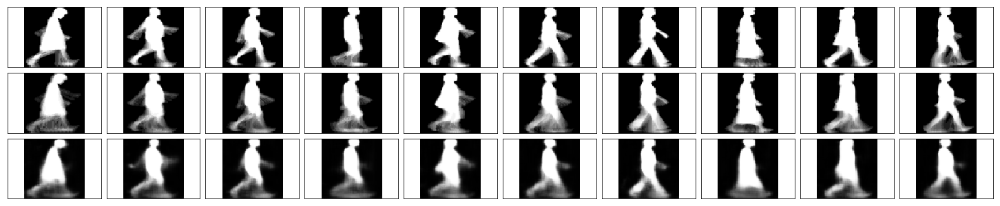

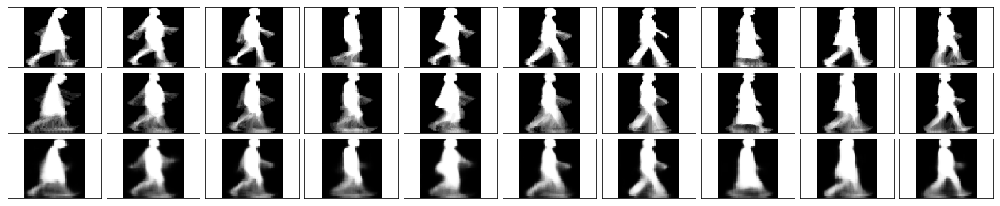

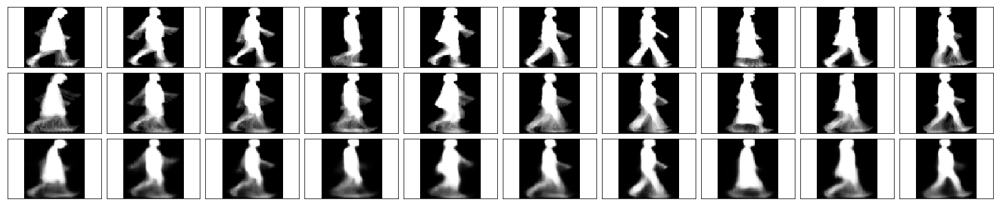

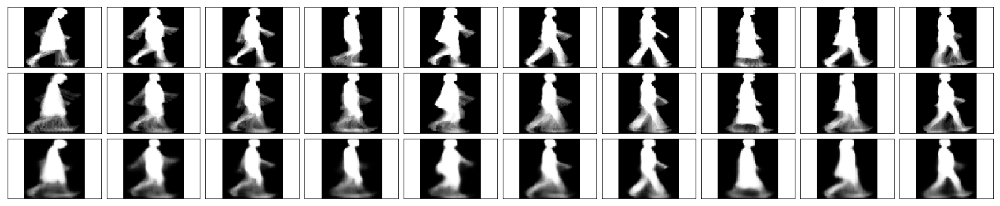

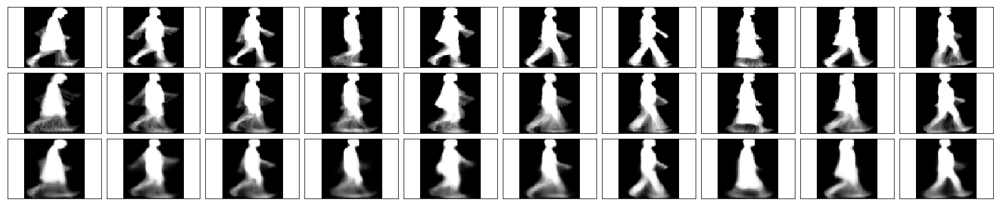

...

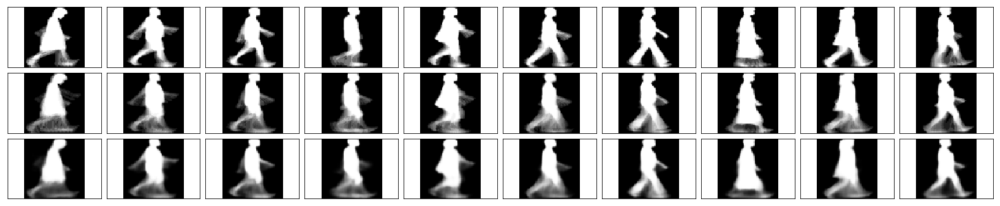

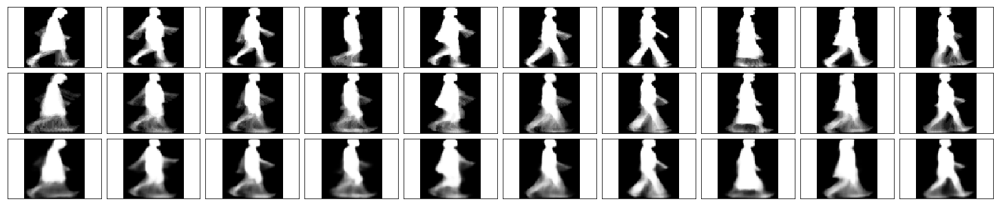

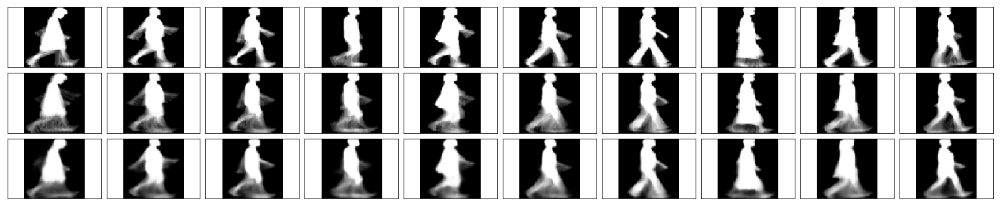

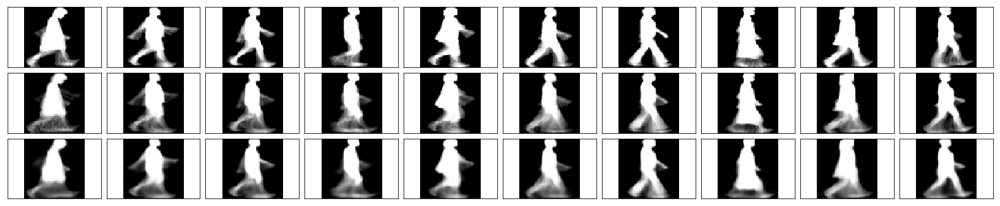

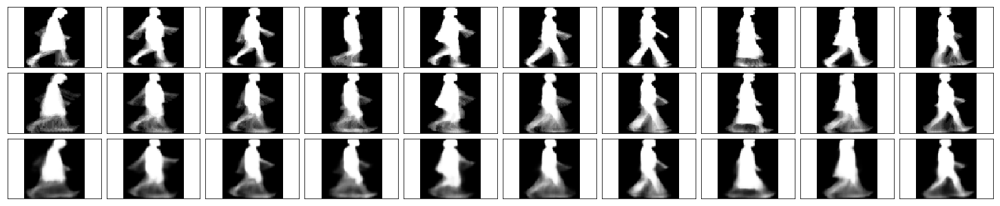

In [47]:
!mkdir checkpoints_view_invariant

epochs = 3000
num_layers = 3
batch_size = 80
conv_kern_size = (4,4) #
conv_strides = (1,1) ##
pool_size = (2,2)
pool_strides = (2,2)
# up_size = [(8,8), (16,16), (32,32), (64,64)]
up_size = [(16,16), (32,32), (64,64)]
# up_size = [(32,32), (64,64)]
de_kern_size = (4,4) #
de_conv_strides = (1,1) ##
out_kern_size = (4,4) #
out_strides = (1,1)
std = 0.02

for lr in [0.0001]:
#                 log_string = 'logs/4/lr={},nl={},ls={},bs={}'.format(lr, num_layers, lstm_size, batch_size)
    save_string = './checkpoints_view_invariant/5to10_add-more-data_lr={}_nl={}_bs={}.ckpt'.format(lr, num_layers, batch_size)
                
#             writer to_frame= tf.summary.FileWriter(log_string)
#     build_graph(kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, 
#                 de_conv_strides, out_kern_size, out_strides, up_size=[(16,16), (32,32), (64,64)], set_is_training=True):
    
    model = build_graph(conv_kern_size, std, conv_strides, pool_size, pool_strides, de_kern_size, de_conv_strides,
                        out_kern_size, out_strides, up_size=up_size)

    train(model, epochs, save_string)
                
    print(' ')
    print(' ')
    print("leraning_rate={},num_layers={},batch_size={} finished, saved".format(lr, num_layers, batch_size))
    print(' ')
    print(' ')

<br><br><br><br><br><br><br><br><br>

## Network Architecture

The encoder part of the network will be a typical convolutional pyramid. Each convolutional layer will be followed by a max-pooling layer to reduce the dimensions of the layers. The decoder though might be something new to you. The decoder needs to convert from a narrow representation to a wide reconstructed image. For example, the representation could be a 4x4x8 max-pool layer. This is the output of the encoder, but also the input to the decoder. We want to get a 28x28x1 image out from the decoder so we need to work our way back up from the narrow decoder input layer. A schematic of the network is shown below.

<img src='assets/convolutional_autoencoder.png' width=500px>

Here our final encoder layer has size 4x4x8 = 128. The original images have size 28x28 = 784, so the encoded vector is roughly 16% the size of the original image. These are just suggested sizes for each of the layers. Feel free to change the depths and sizes, but remember our goal here is to find a small representation of the input data.

### What's going on with the decoder

Okay, so the decoder has these "Upsample" layers that you might not have seen before. First off, I'll discuss a bit what these layers *aren't*. Usually, you'll see **transposed convolution** layers used to increase the width and height of the layers. They work almost exactly the same as convolutional layers, but in reverse. A stride in the input layer results in a larger stride in the transposed convolution layer. For example, if you have a 3x3 kernel, a 3x3 patch in the input layer will be reduced to one unit in a convolutional layer. Comparatively, one unit in the input layer will be expanded to a 3x3 path in a transposed convolution layer. The TensorFlow API provides us with an easy way to create the layers, [`tf.nn.conv2d_transpose`](https://www.tensorflow.org/api_docs/python/tf/nn/conv2d_transpose). 

However, transposed convolution layers can lead to artifacts in the final images, such as checkerboard patterns. This is due to overlap in the kernels which can be avoided by setting the stride and kernel size equal. In [this Distill article](http://distill.pub/2016/deconv-checkerboard/) from Augustus Odena, *et al*, the authors show that these checkerboard artifacts can be avoided by resizing the layers using nearest neighbor or bilinear interpolation (upsampling) followed by a convolutional layer. In TensorFlow, this is easily done with [`tf.image.resize_images`](https://www.tensorflow.org/versions/r1.1/api_docs/python/tf/image/resize_images), followed by a convolution. Be sure to read the Distill article to get a better understanding of deconvolutional layers and why we're using upsampling.

> **Exercise:** Build the network shown above. Remember that a convolutional layer with strides of 1 and 'same' padding won't reduce the height and width. That is, if the input is 28x28 and the convolution layer has stride = 1 and 'same' padding, the convolutional layer will also be 28x28. The max-pool layers are used the reduce the width and height. A stride of 2 will reduce the size by 2. Odena *et al* claim that nearest neighbor interpolation works best for the upsampling, so make sure to include that as a parameter in `tf.image.resize_images` or use [`tf.image.resize_nearest_neighbor`]( `https://www.tensorflow.org/api_docs/python/tf/image/resize_nearest_neighbor). For convolutional layers, use [`tf.layers.conv2d`](https://www.tensorflow.org/api_docs/python/tf/layers/conv2d). For example, you would write `conv1 = tf.layers.conv2d(inputs, 32, (5,5), padding='same', activation=tf.nn.relu)` for a layer with a depth of 32, a 5x5 kernel, stride of (1,1), padding is 'same', and a ReLU activation. Similarly, for the max-pool layers, use [`tf.layers.max_pooling2d`](https://www.tensorflow.org/api_docs/python/tf/layers/max_pooling2d).

## Training

As before, here wi'll train the network. Instead of flattening the images though, we can pass them in as 28x28x1 arrays.

In [6]:
sess = tf.Session()

In [ ]:
epochs = 20
batch_size = 200
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        imgs = batch[0].reshape((-1, 28, 28, 1))
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

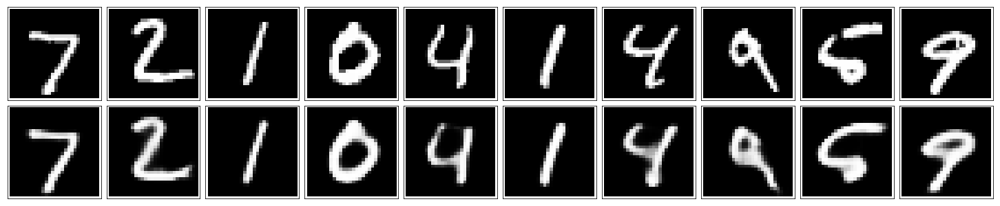

In [13]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
reconstructed = sess.run(decoded, feed_dict={inputs_: in_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([in_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)


fig.tight_layout(pad=0.1)

In [19]:
sess.close()

## Denoising

As I've mentioned before, autoencoders like the ones you've built so far aren't too useful in practive. However, they can be used to denoise images quite successfully just by training the network on noisy images. We can create the noisy images ourselves by adding Gaussian noise to the training images, then clipping the values to be between 0 and 1. We'll use noisy images as input and the original, clean images as targets. Here's an example of the noisy images I generated and the denoised images.

![Denoising autoencoder](assets/denoising.png)


Since this is a harder problem for the network, we'll want to use deeper convolutional layers here, more feature maps. I suggest something like 32-32-16 for the depths of the convolutional layers in the encoder, and the same depths going backward through the decoder. Otherwise the architecture is the same as before.

> **Exercise:** Build the network for the denoising autoencoder. It's the same as before, but with deeper layers. I suggest 32-32-16 for the depths, but you can play with these numbers, or add more layers.

In [21]:
inputs_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='inputs')
targets_ = tf.placeholder(tf.float32, (None, 28, 28, 1), name='targets')

### Encoder
conv1 = tf.layers.conv2d(inputs_, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32
maxpool1 = tf.layers.max_pooling2d(conv1, (2,2), (2,2), padding='same')
# Now 14x14x32
conv2 = tf.layers.conv2d(maxpool1, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
maxpool2 = tf.layers.max_pooling2d(conv2, (2,2), (2,2), padding='same')
# Now 7x7x32
conv3 = tf.layers.conv2d(maxpool2, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
encoded = tf.layers.max_pooling2d(conv3, (2,2), (2,2), padding='same')
# Now 4x4x16

### Decoder
upsample1 = tf.image.resize_nearest_neighbor(encoded, (7,7))
# Now 7x7x16
conv4 = tf.layers.conv2d(upsample1, 16, (3,3), padding='same', activation=tf.nn.relu)
# Now 7x7x16
upsample2 = tf.image.resize_nearest_neighbor(conv4, (14,14))
# Now 14x14x16
conv5 = tf.layers.conv2d(upsample2, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 14x14x32
upsample3 = tf.image.resize_nearest_neighbor(conv5, (28,28))
# Now 28x28x32
conv6 = tf.layers.conv2d(upsample3, 32, (3,3), padding='same', activation=tf.nn.relu)
# Now 28x28x32

logits = tf.layers.conv2d(conv6, 1, (3,3), padding='same', activation=None)
#Now 28x28x1

decoded = tf.nn.sigmoid(logits, name='decoded')

loss = tf.nn.sigmoid_cross_entropy_with_logits(labels=targets_, logits=logits)
cost = tf.reduce_mean(loss)
opt = tf.train.AdamOptimizer(0.001).minimize(cost)

In [22]:
sess = tf.Session()

In [ ]:
epochs = 100
batch_size = 200
# Set's how much noise we're adding to the MNIST images
noise_factor = 0.5
sess.run(tf.global_variables_initializer())
for e in range(epochs):
    for ii in range(mnist.train.num_examples//batch_size):
        batch = mnist.train.next_batch(batch_size)
        # Get images from the batch
        imgs = batch[0].reshape((-1, 28, 28, 1))
        
        # Add random noise to the input images
        noisy_imgs = imgs + noise_factor * np.random.randn(*imgs.shape)
        # Clip the images to be between 0 and 1
        noisy_imgs = np.clip(noisy_imgs, 0., 1.)
        
        # Noisy images as inputs, original images as targets
        batch_cost, _ = sess.run([cost, opt], feed_dict={inputs_: noisy_imgs,
                                                         targets_: imgs})

        print("Epoch: {}/{}...".format(e+1, epochs),
              "Training loss: {:.4f}".format(batch_cost))

## Checking out the performance

Here I'm adding noise to the test images and passing them through the autoencoder. It does a suprising great job of removing the noise, even though it's sometimes difficult to tell what the original number is.

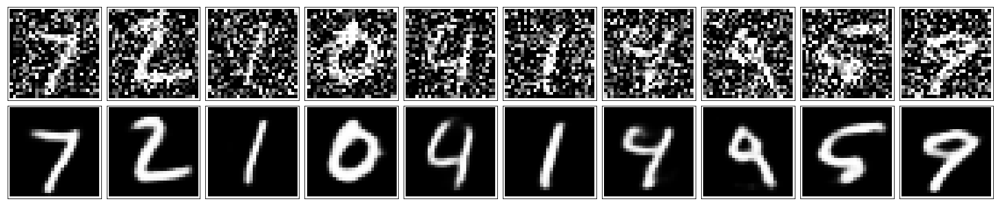

In [29]:
fig, axes = plt.subplots(nrows=2, ncols=10, sharex=True, sharey=True, figsize=(20,4))
in_imgs = mnist.test.images[:10]
noisy_imgs = in_imgs + noise_factor * np.random.randn(*in_imgs.shape)
noisy_imgs = np.clip(noisy_imgs, 0., 1.)

reconstructed = sess.run(decoded, feed_dict={inputs_: noisy_imgs.reshape((10, 28, 28, 1))})

for images, row in zip([noisy_imgs, reconstructed], axes):
    for img, ax in zip(images, row):
        ax.imshow(img.reshape((28, 28)), cmap='Greys_r')
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

fig.tight_layout(pad=0.1)